In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**MASKS FROM COORDINATES**

In [ ]:
import cv2
import numpy as np
import os
import glob

def create_mask_from_polygons(image_shape, polygons):
    mask = np.zeros(image_shape[:2], dtype=np.uint8)  # Assuming grayscale mask, single class
    for polygon in polygons:
        # Convert normalized coordinates to actual pixel coordinates
        int_coords = np.array([[int(x * image_shape[1]), int(y * image_shape[0])] for x, y in polygon], dtype=np.int32)
        cv2.fillPoly(mask, [int_coords], 255)  # Fill the polygon with 255
    return mask

def process_labels(label_dir, image_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    label_files = glob.glob(os.path.join(label_dir, '*.txt'))
    for label_file in label_files:
        image_file = os.path.join(image_dir, os.path.basename(label_file).replace('.txt', '.jpg'))  # Change file extension as needed
        if not os.path.exists(image_file):
            continue  # Skip if corresponding image does not exist

        image = cv2.imread(image_file)
        if image is None:
            continue  # Skip if image couldn't be read

        polygons = []
        with open(label_file, 'r') as file:
            for line in file:
                parts = list(map(float, line.strip().split()))
                # Assuming parts[0] is the class id, followed by pairs of coordinates
                polygon = [(parts[i], parts[i + 1]) for i in range(1, len(parts), 2)]
                polygons.append(polygon)

        mask = create_mask_from_polygons(image.shape, polygons)
        mask_filename = os.path.join(output_dir, os.path.basename(image_file).replace('.jpg', '_mask.png'))
        cv2.imwrite(mask_filename, mask)

# Configuration
base_dir = '/content/drive/MyDrive/DL_semester_project/Pothole_Segmentation_YOLOv8'
train_labels = os.path.join(base_dir, 'train', 'labels')
train_images = os.path.join(base_dir, 'train', 'images')
val_labels = os.path.join(base_dir, 'valid', 'labels')
val_images = os.path.join(base_dir, 'valid', 'images')
train_masks_dir = os.path.join(base_dir, 'train', 'training_labels')
val_masks_dir = os.path.join(base_dir, 'valid', 'val_labels')

# Process Training and Validation Labels
process_labels(train_labels, train_images, train_masks_dir)
process_labels(val_labels, val_images, val_masks_dir)

**Resunet_Model**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Activation, BatchNormalization, Add
from tensorflow.keras.models import Model
import os
# Define the ResUNet architecture
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def residual_block(input, num_filters):
    res = conv_block(input, num_filters)
    res = conv_block(res, num_filters)
    shortcut = Conv2D(num_filters, 1, padding="same")(input)
    shortcut = BatchNormalization()(shortcut)
    return Add()([shortcut, res])

def encoder(input, num_filters):
    x = residual_block(input, num_filters)
    p = MaxPooling2D((2, 2))(x)
    return x, p

def decoder(input, skip_features, num_filters):
    x = UpSampling2D((2, 2))(input)
    x = concatenate([x, skip_features])
    x = residual_block(x, num_filters)
    return x

def build_resunet(input_shape):
    inputs = Input(input_shape)
    s1, p1 = encoder(inputs, 64)
    s2, p2 = encoder(p1, 128)
    s3, p3 = encoder(p2, 256)
    s4, p4 = encoder(p3, 512)
    bridge = residual_block(p4, 1024)
    d1 = decoder(bridge, s4, 512)
    d2 = decoder(d1, s3, 256)
    d3 = decoder(d2, s2, 128)
    d4 = decoder(d3, s1, 64)
    outputs = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs=inputs, outputs=outputs, name="ResUNet")
    return model

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from typing import Tuple, Generator

def create_datagen() -> ImageDataGenerator:
    """Create a data generator with specific augmentations."""
    return ImageDataGenerator(
        rescale=1./255,
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

In [ ]:
def train_generator(img_path: str, mask_path: str, batch_size: int) -> Generator[Tuple[np.ndarray, np.ndarray], None, None]:
    image_datagen = create_datagen()
    mask_datagen = create_datagen()

    image_generator = image_datagen.flow_from_directory(
        img_path,
        classes=['images'],
        class_mode=None,
        color_mode='rgb',
        target_size=(256, 256),
        batch_size=batch_size,
        seed=42
    )

    mask_generator = mask_datagen.flow_from_directory(
        mask_path,
        classes=['labels'],
        class_mode=None,
        color_mode='grayscale',
        target_size=(256, 256),
        batch_size=batch_size,
        seed=42
    )

    while True:
        imgs = next(image_generator)  # Correct method to retrieve the next batch
        masks = next(mask_generator)  # Correct method to retrieve the next batch
        yield (imgs, masks)


In [ ]:
# Paths
base_dir = '/content/drive/MyDrive/DL_semester_project/Pothole_Segmentation_YOLOv8'
train_img_path = os.path.join(base_dir, 'train')
train_mask_path = os.path.join(base_dir, 'train')
val_img_path = os.path.join(base_dir, 'valid')
val_mask_path = os.path.join(base_dir, 'valid')

# Create data generators
batch_size = 8
train_gen = train_generator(train_img_path, train_mask_path, batch_size)
val_gen = train_generator(val_img_path, val_mask_path, batch_size)

# Build and compile the model
model = build_resunet((256, 256, 3))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Define the number of images based on your generator logs
num_train_images = 720  # Adjust based on actual data
num_val_images = 180    # Adjust based on actual data

# Calculate the number of steps per epoch
train_steps = num_train_images // batch_size
val_steps = num_val_images // batch_size

# Train the model
history = model.fit(
    train_gen,
    steps_per_epoch=train_steps,  # Corrected to use calculated steps
    epochs=50,                    # Adjust based on performance and overfitting
    validation_data=val_gen,
    validation_steps=val_steps     # Corrected to use calculated steps
)

Found 720 images belonging to 1 classes.
Found 720 images belonging to 1 classes.
Epoch 1/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7413 - loss: 0.6362Found 60 images belonging to 1 classes.
Found 60 images belonging to 1 classes.
90/90 ━━━━━━━━━━━━━━━━━━━━ 404s 3s/step - accuracy: 0.7420 - loss: 0.6346 - val_accuracy: 0.2236 - val_loss: 1427.6561
Epoch 2/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.8408 - loss: 0.3885 - val_accuracy: 0.2677 - val_loss: 9.2926
Epoch 3/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - accuracy: 0.8556 - loss: 0.3540 - val_accuracy: 0.7948 - val_loss: 0.6661
Epoch 4/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.8451 - loss: 0.3683 - val_accuracy: 0.8274 - val_loss: 0.4118
Epoch 5/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.8549 - loss: 0.3425 - val_accuracy: 0.8543 - val_loss: 0.3331
Epoch 6/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.8612 - loss: 0.3265 - val_accuracy: 0.8338 - val_loss: 0.3720
Epoch 7

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    return iou

def calculate_dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred)) if (np.sum(y_true) + np.sum(y_pred)) != 0 else 0

def evaluate_model(model, val_gen, num_val_images):
    total_iou = 0
    total_dice = 0
    total_accuracy = 0

    for _ in range(num_val_images // batch_size):
        imgs, masks = next(val_gen)
        preds = model.predict(imgs)
        preds = (preds > 0.5).astype(np.uint8)  # Binarize predictions

        for i in range(len(masks)):
            total_iou += calculate_iou(masks[i].reshape(-1), preds[i].reshape(-1))
            total_dice += calculate_dice_coefficient(masks[i].reshape(-1), preds[i].reshape(-1))
            total_accuracy += np.mean(masks[i] == preds[i])  # Pixel accuracy

    avg_iou = total_iou / (num_val_images // batch_size)
    avg_dice = total_dice / (num_val_images // batch_size)
    avg_accuracy = total_accuracy / (num_val_images // batch_size)

    print(f"Average IoU: {avg_iou:.4f}")
    print(f"Average Dice Coefficient: {avg_dice:.4f}")
    print(f"Average Pixel Accuracy: {avg_accuracy:.4f}")

In [ ]:
# Evaluate the model after training
evaluate_model(model, val_gen, num_val_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Average IoU: 3.7303
Average Dice Coefficient: 4.6310
Average Pixel Accuracy: 6.7025


In [ ]:
def visualize_predictions(model, val_gen, num_images=5):
    for _ in range(num_images):
        imgs, masks = next(val_gen)
        preds = model.predict(imgs)
        preds = (preds > 0.5).astype(np.uint8)

        for i in range(len(imgs)):
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 3, 1)
            plt.title('Input Image')
            plt.imshow(imgs[i])
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title('Ground Truth Mask')
            plt.imshow(masks[i].reshape(256, 256), cmap='gray')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title('Predicted Mask')
            plt.imshow(preds[i].reshape(256, 256), cmap='gray')
            plt.axis('off')

            plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


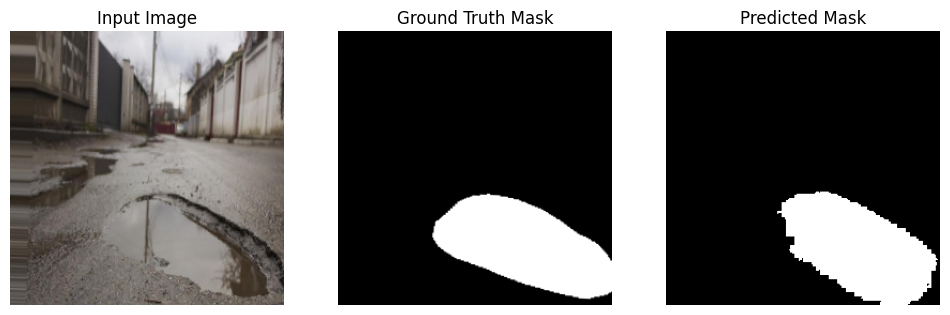

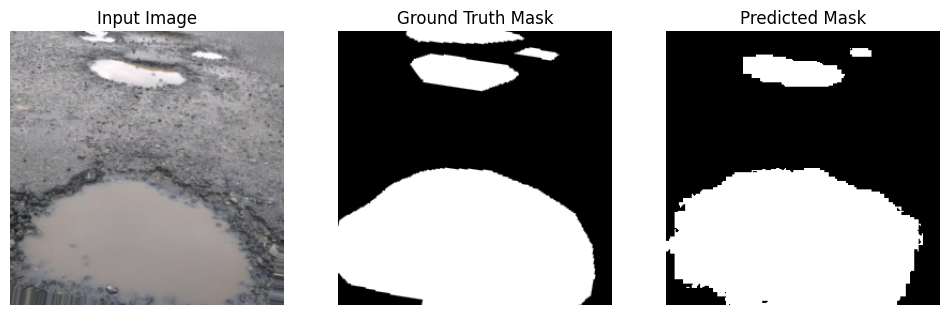

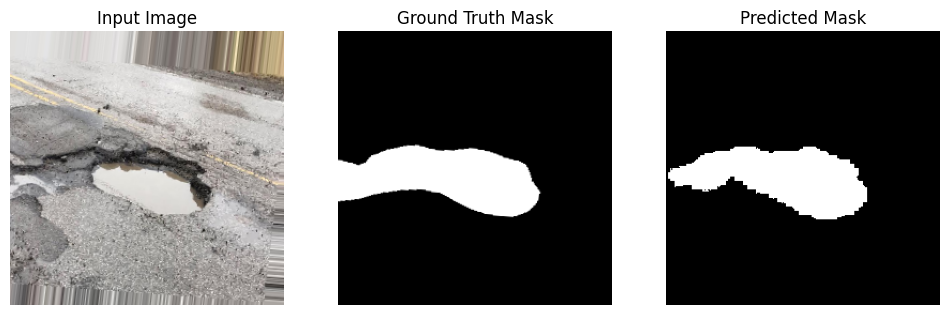

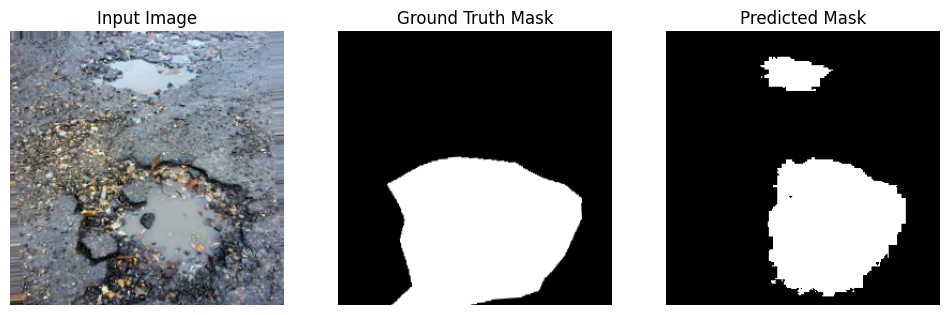

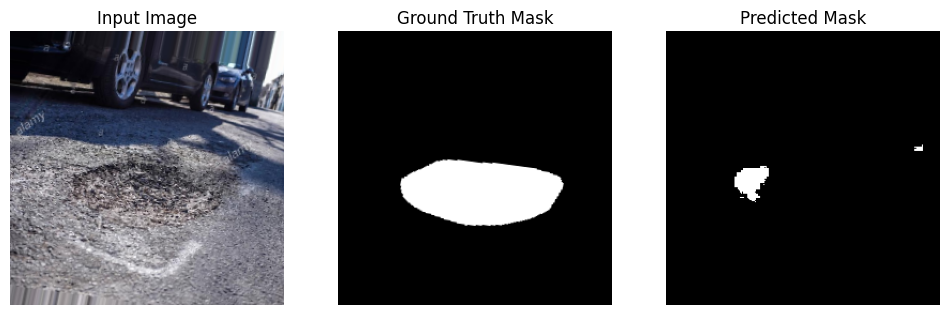

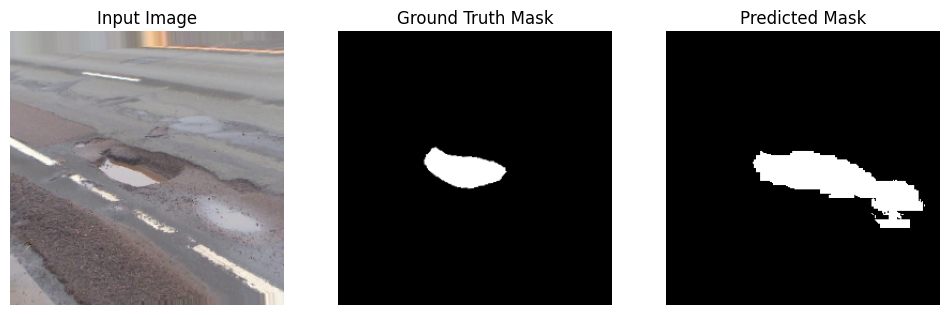

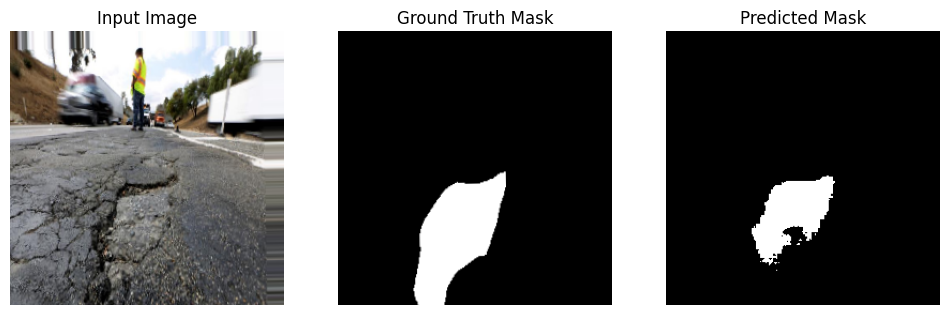

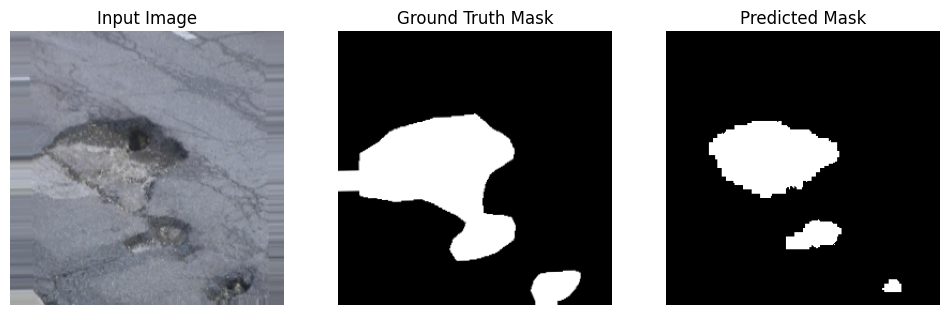

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


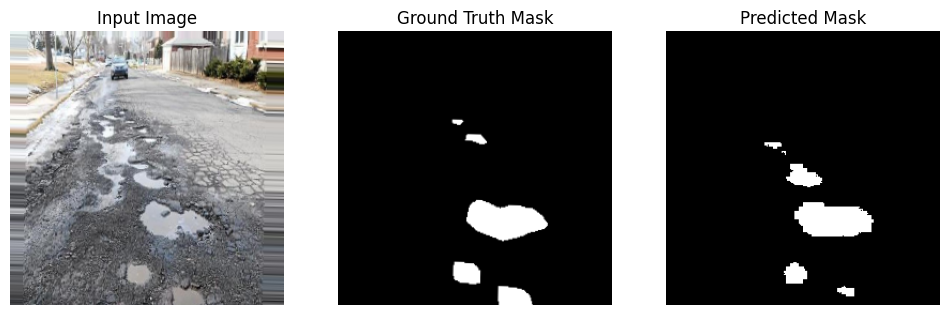

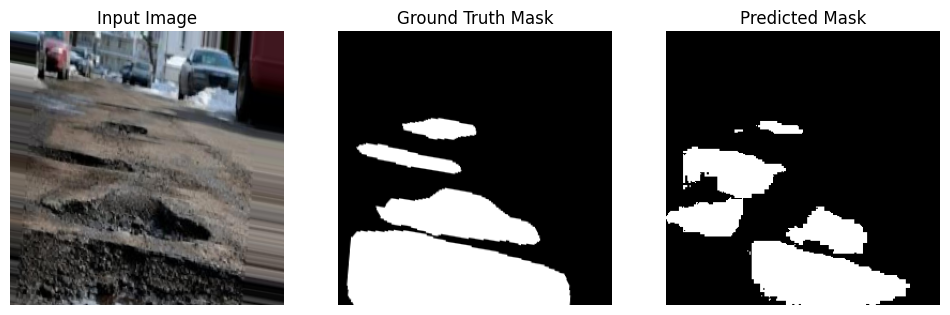

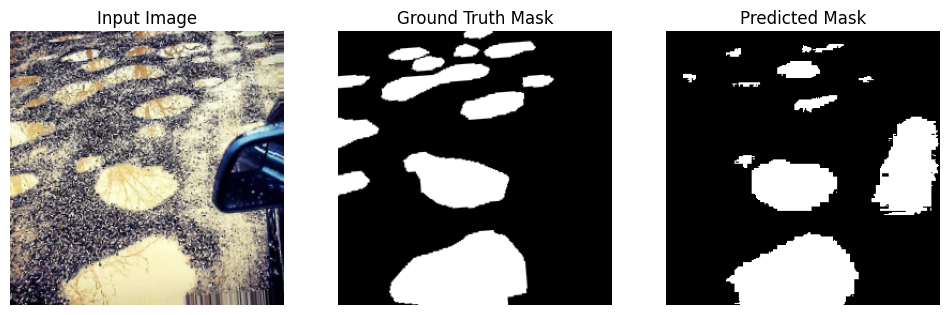

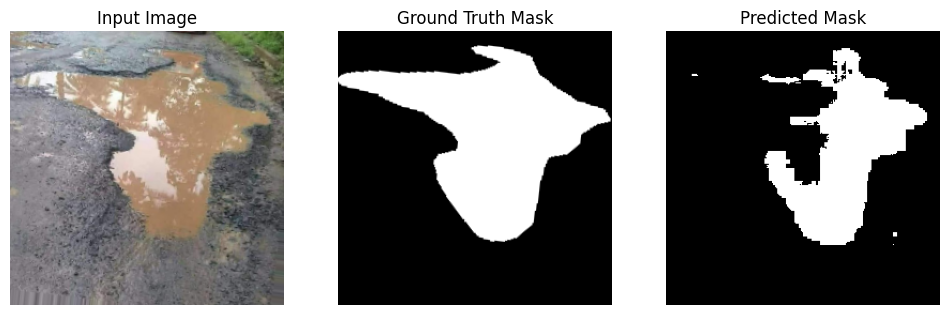

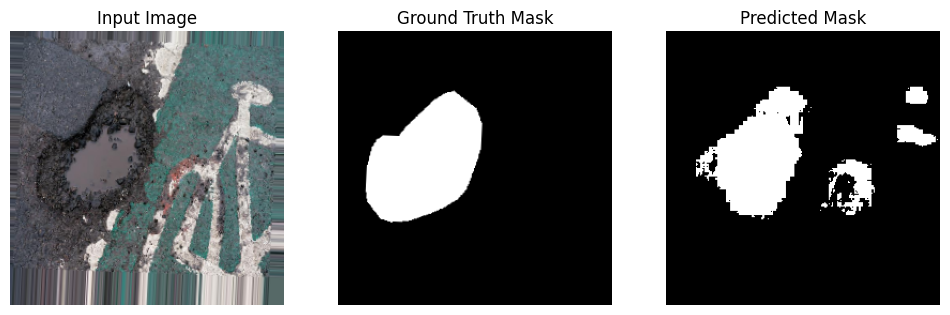

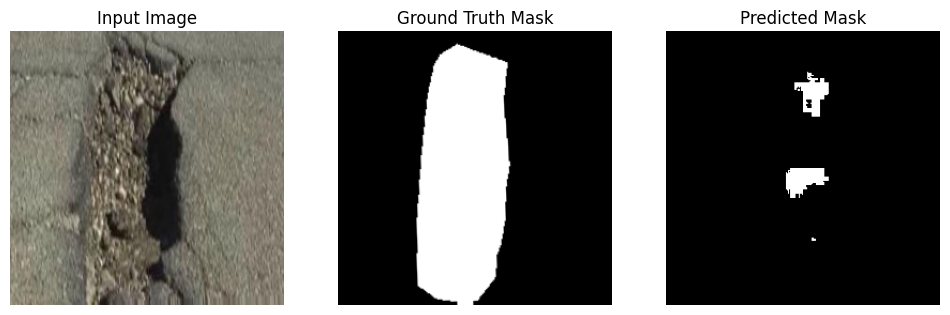

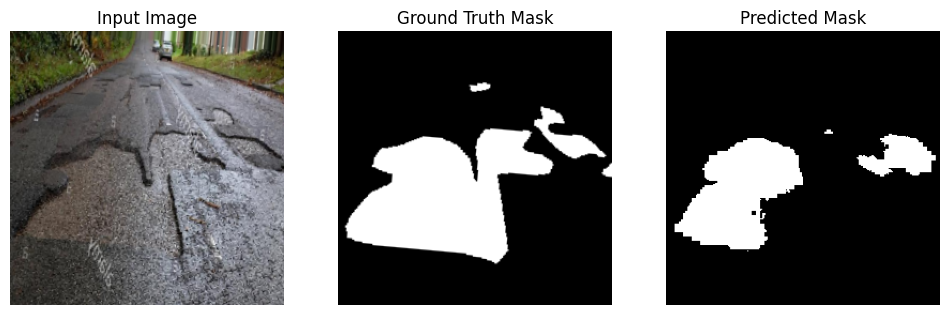

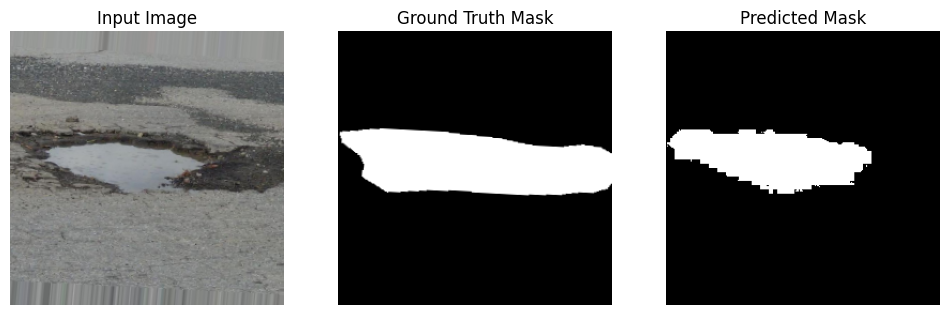

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


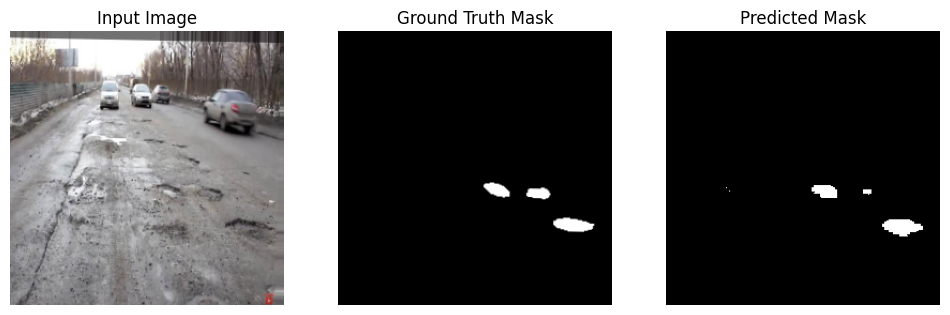

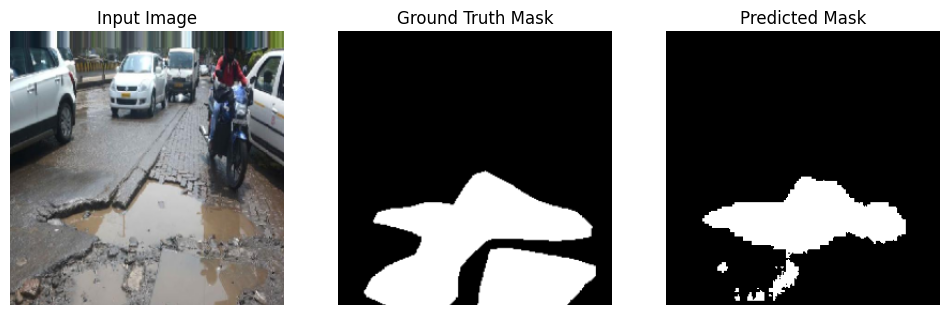

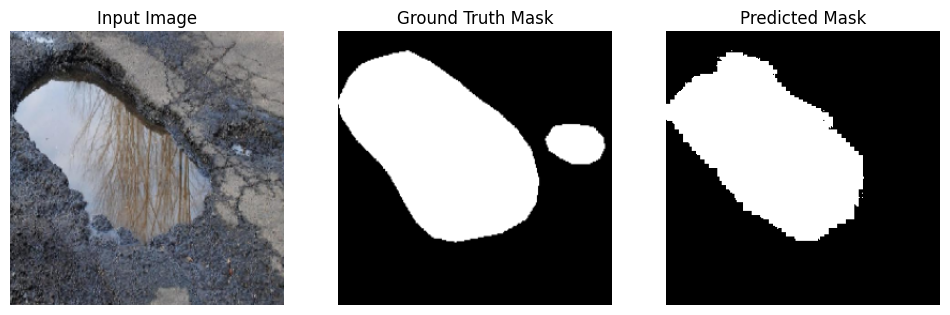

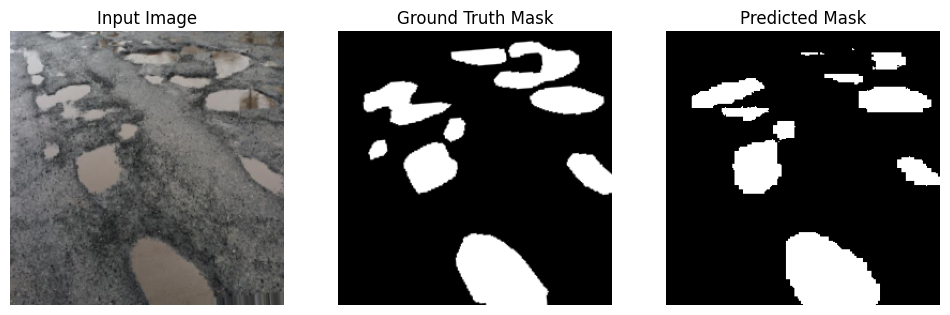

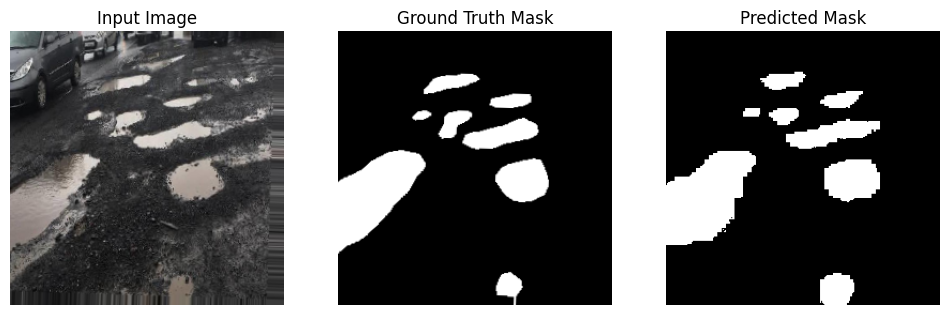

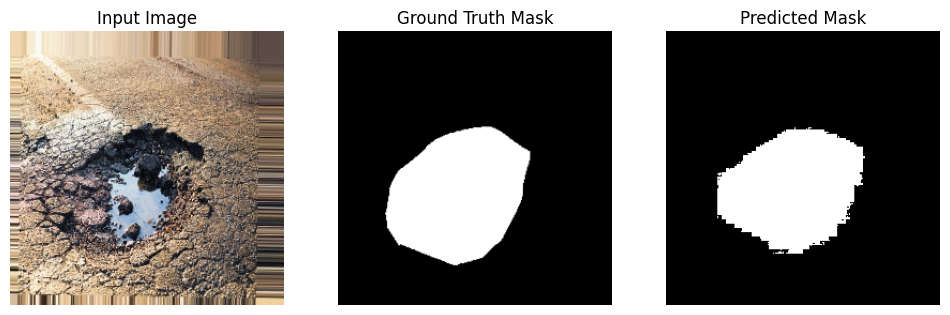

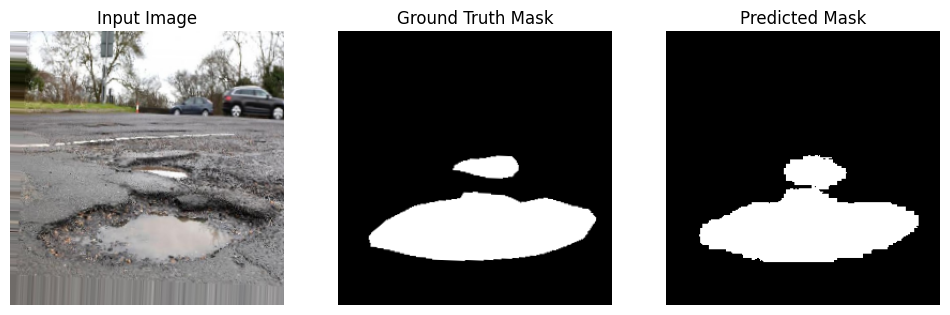

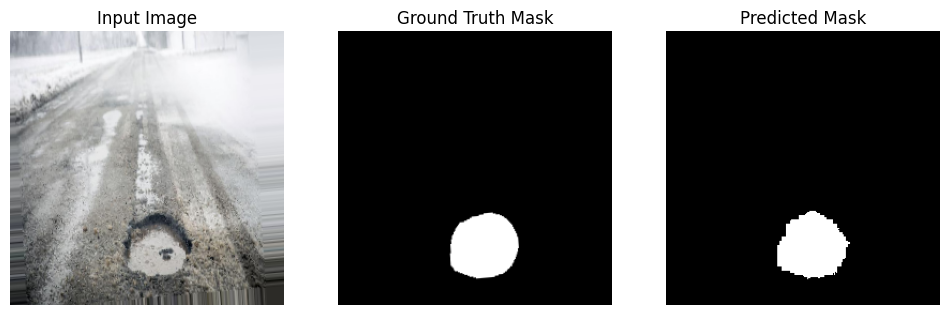

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


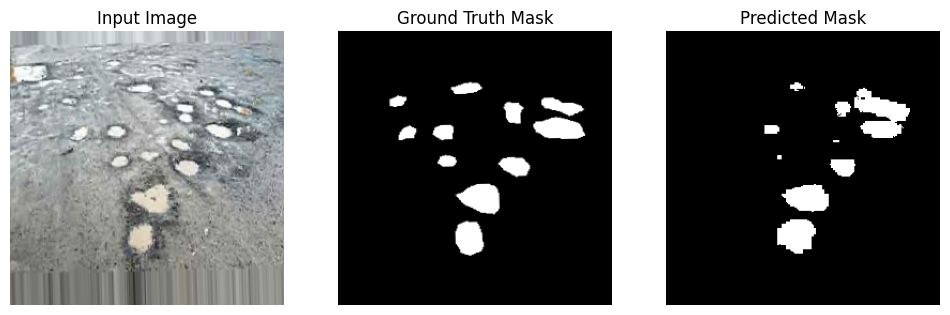

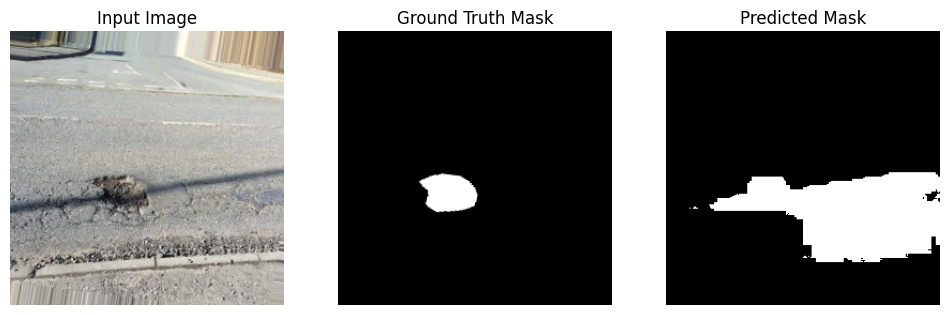

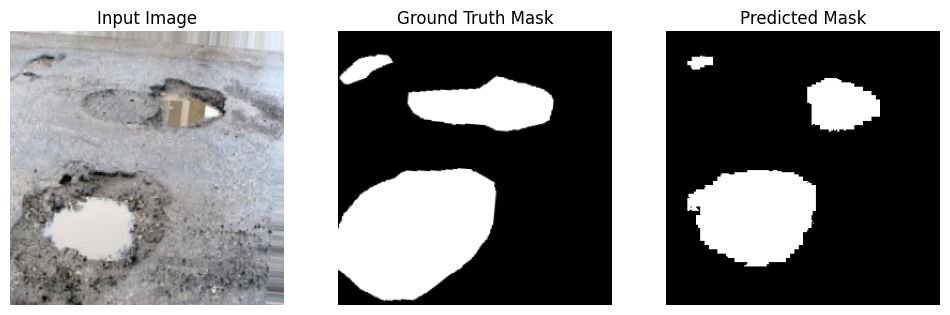

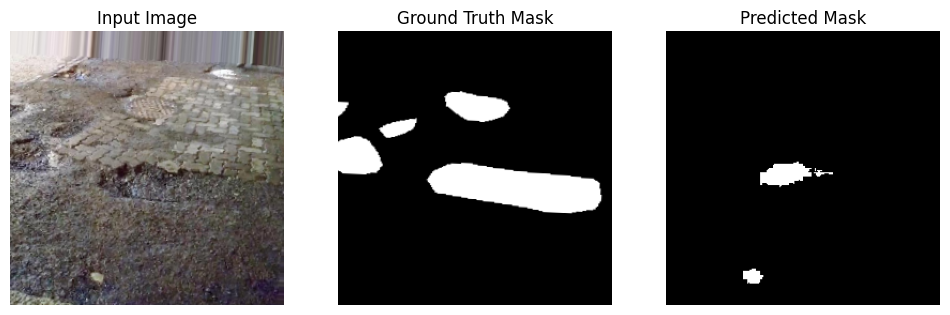

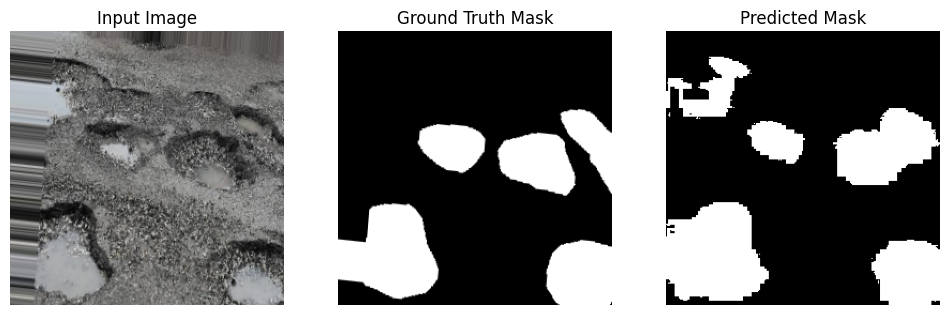

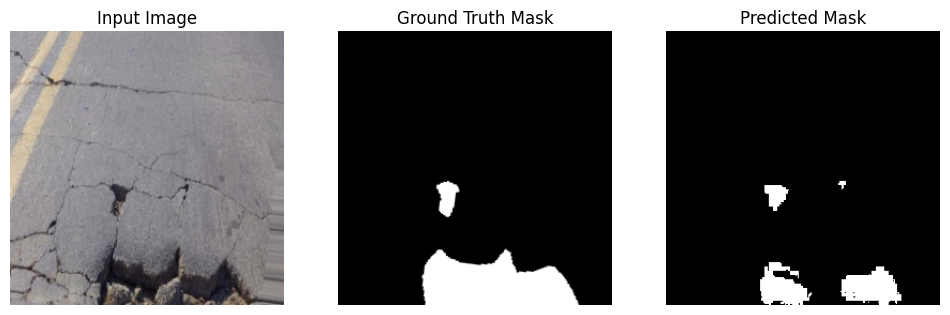

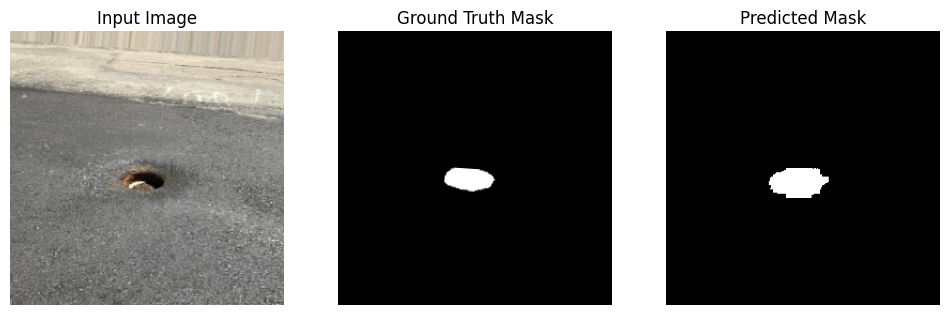

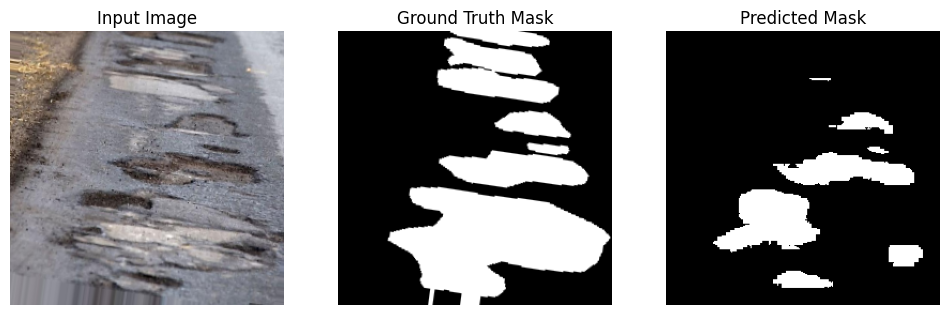

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


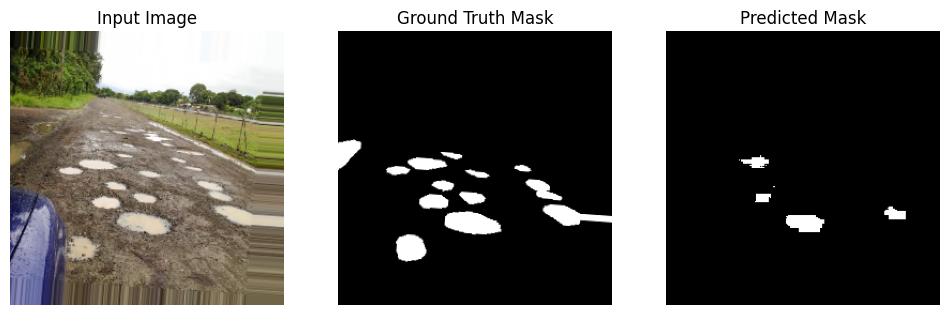

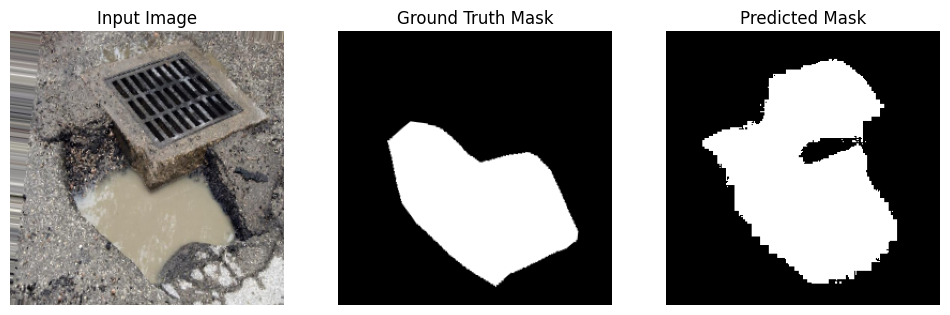

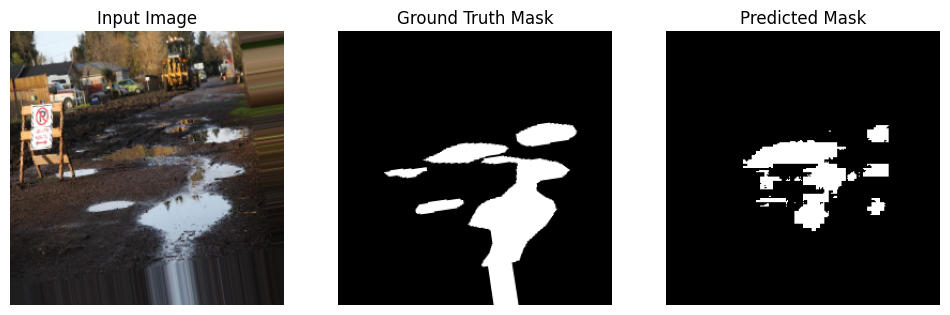

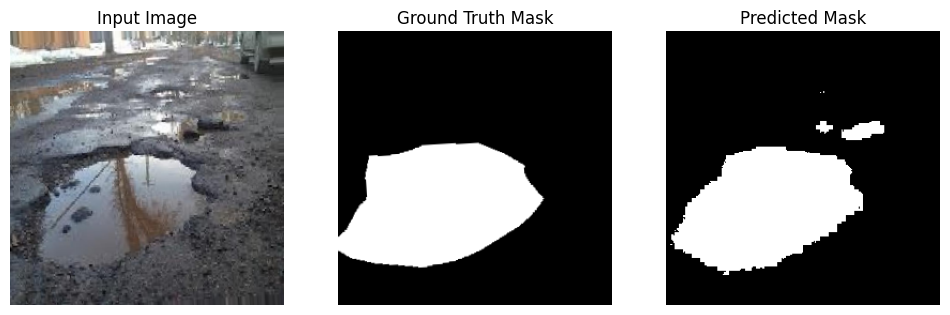

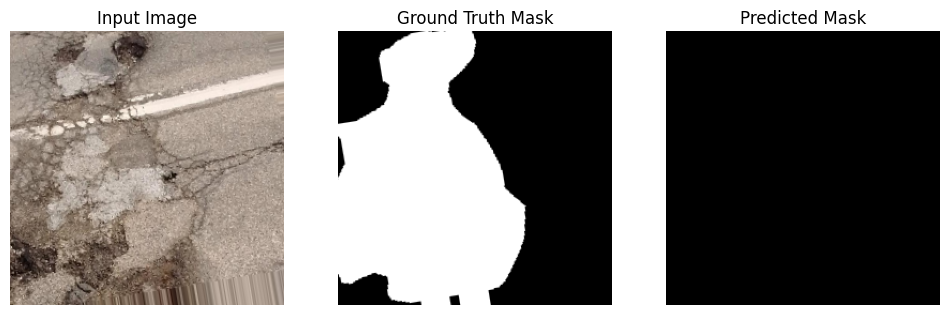

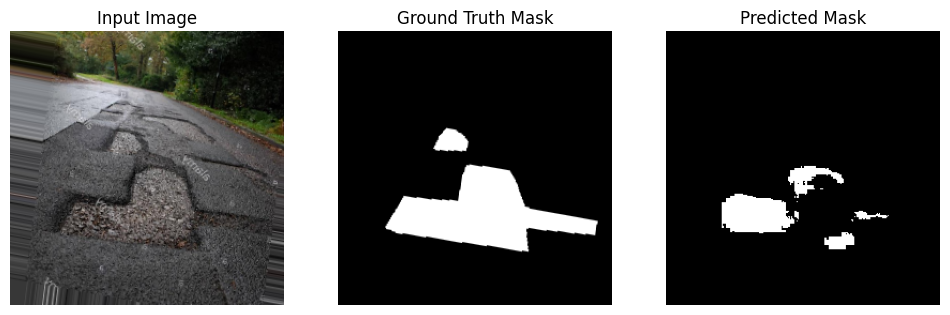

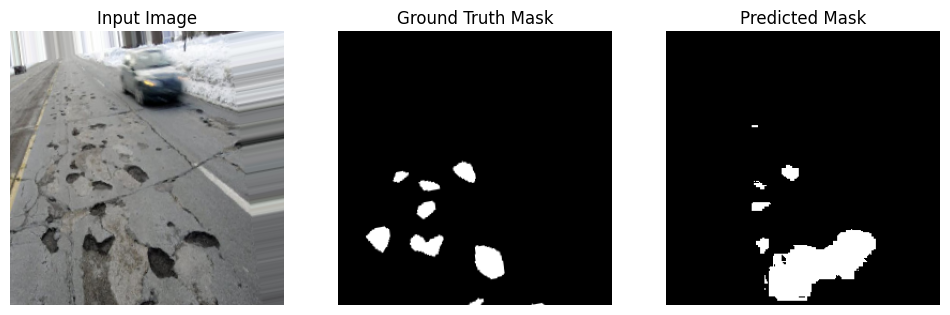

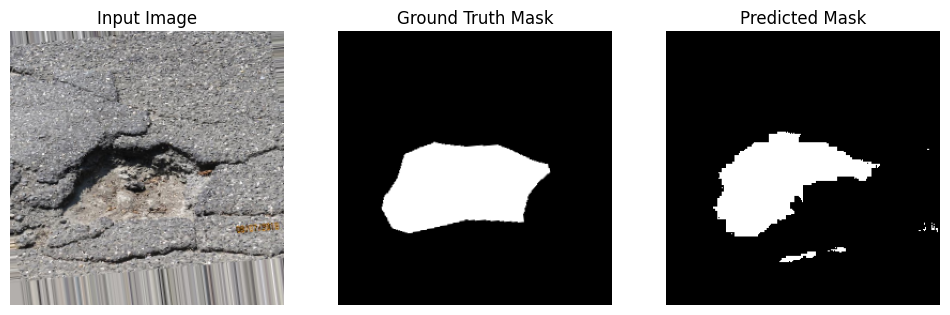

In [ ]:
# Visualize predictions
visualize_predictions(model, val_gen)

In [ ]:
def visualize_predictions_on_original(model, val_gen, num_images=5):
    for _ in range(num_images):
        imgs, masks = next(val_gen)
        preds = model.predict(imgs)
        preds = (preds > 0.5).astype(np.uint8)  # Binarize predictions

        for i in range(len(imgs)):
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 3, 1)
            plt.title('Original Image')
            plt.imshow(imgs[i])
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title('Ground Truth Mask')
            plt.imshow(masks[i].reshape(256, 256), cmap='gray')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title('Predicted Mask Overlayed on Image')
            overlay = imgs[i].copy()
            overlay[preds[i].reshape(256, 256) == 1] = [255, 0, 0]  # Color the predicted mask red
            plt.imshow(overlay)
            plt.axis('off')

            plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


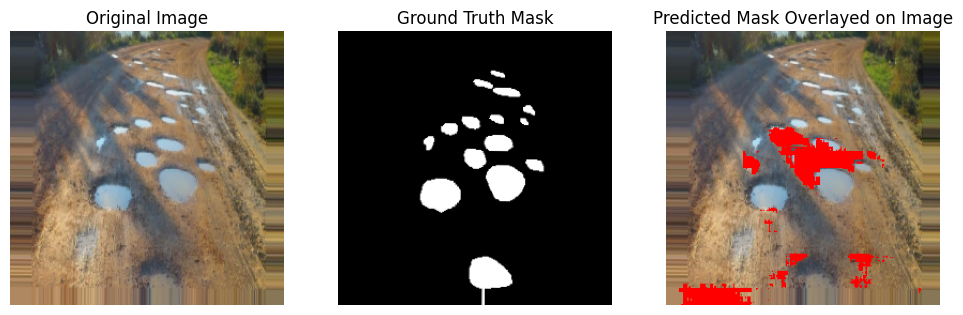

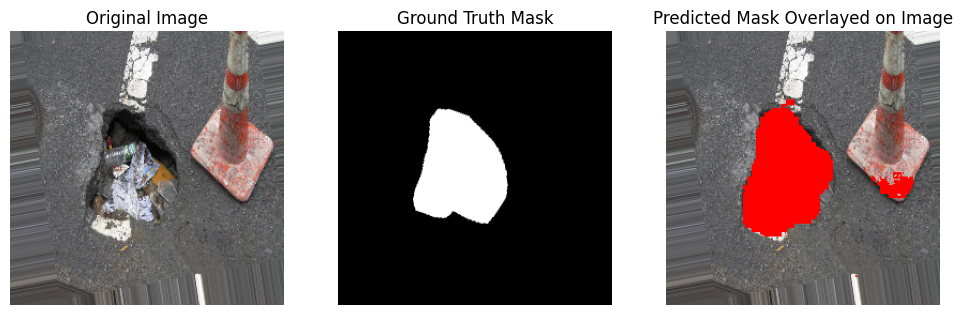

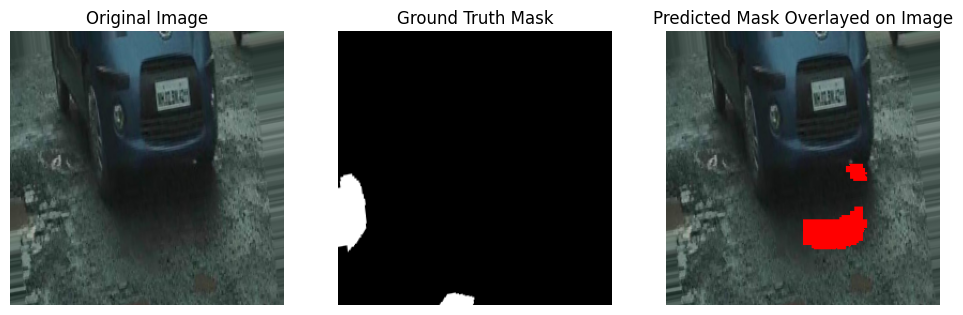

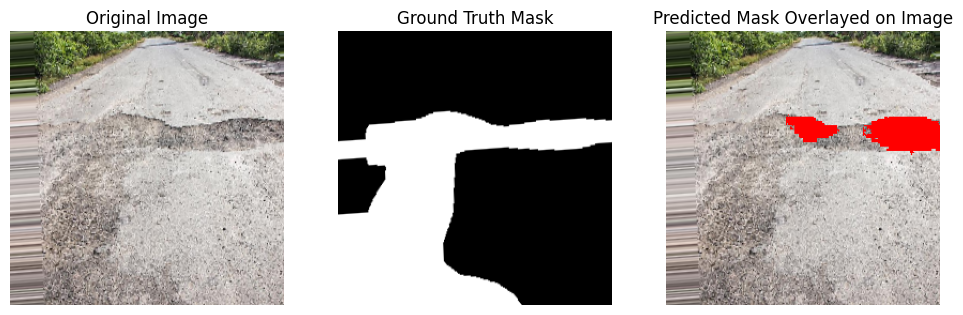

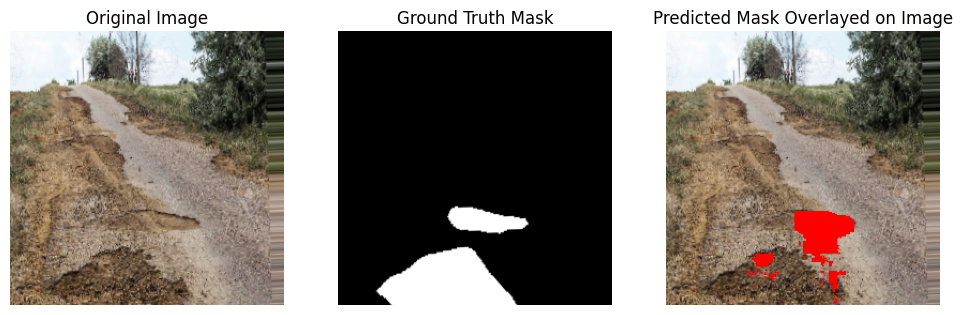

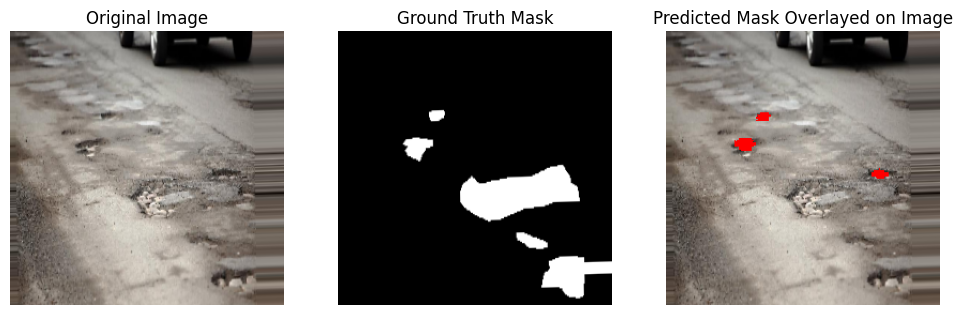

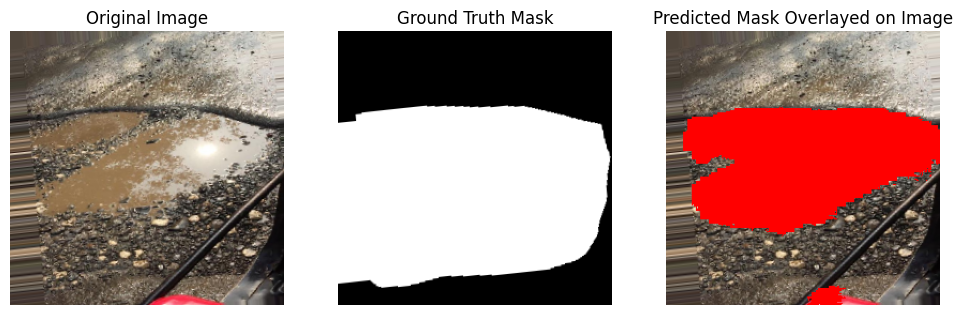

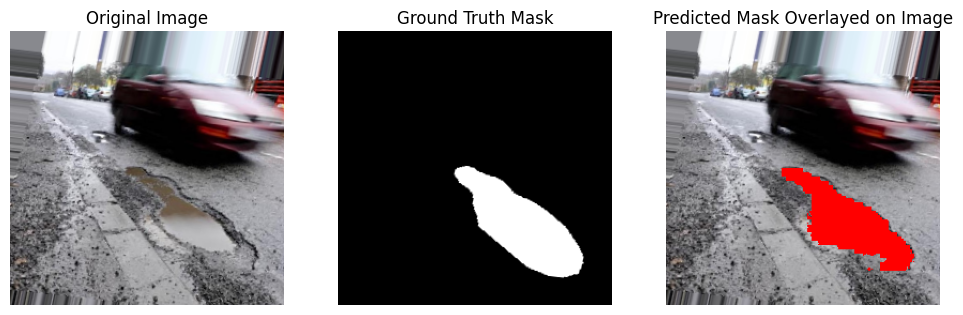

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


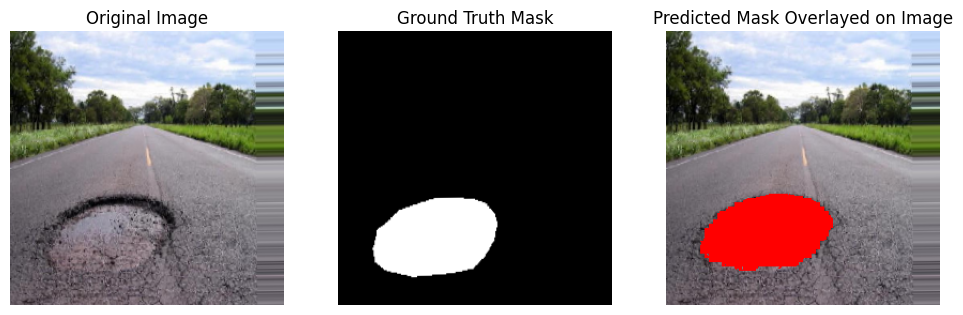

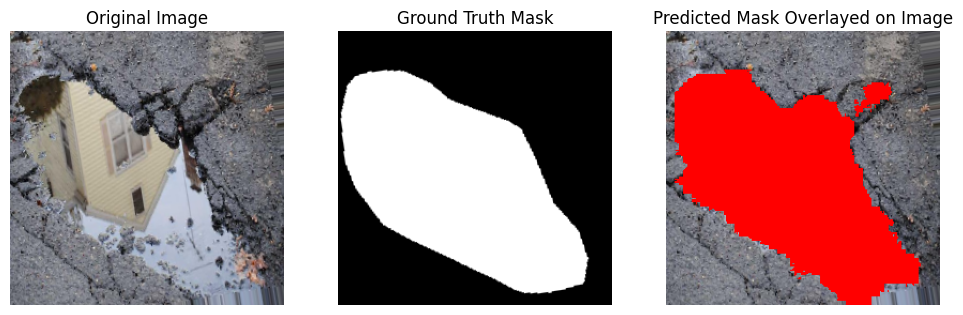

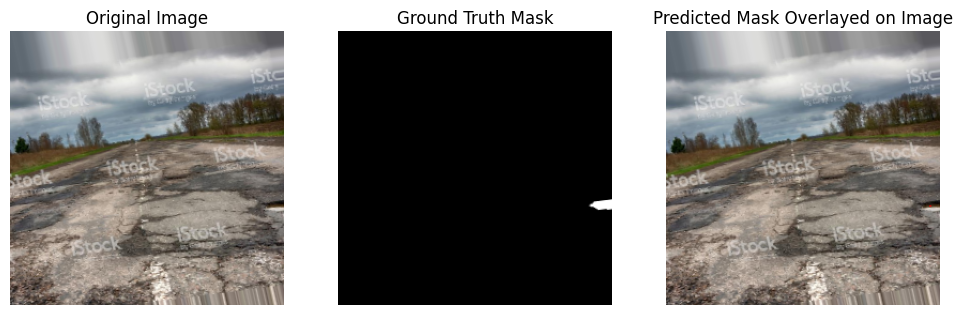

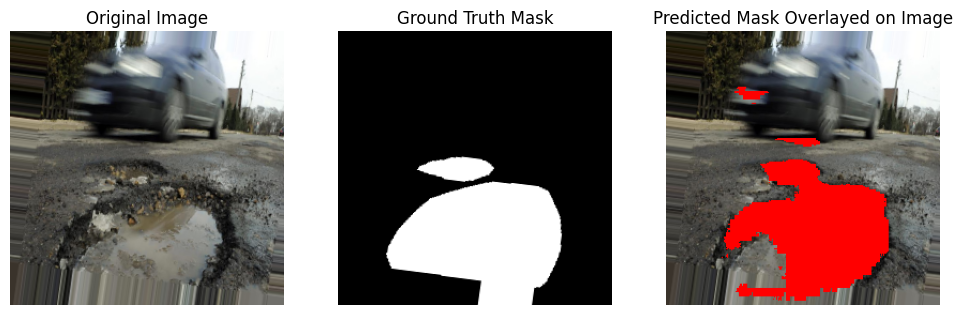

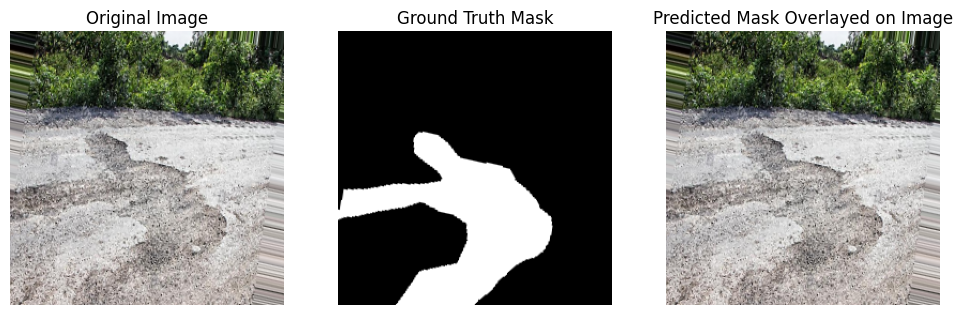

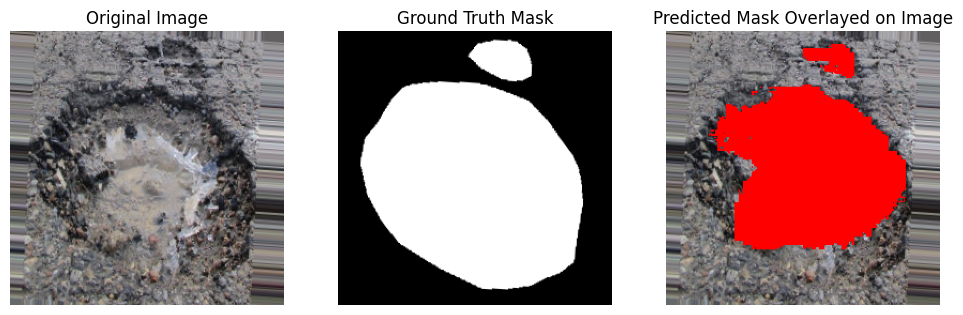

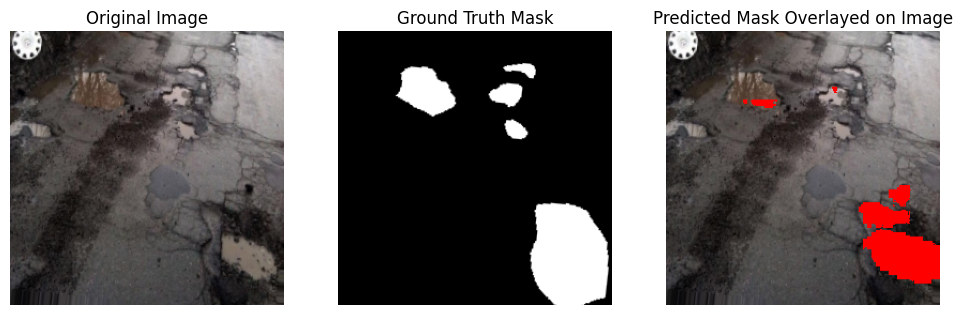

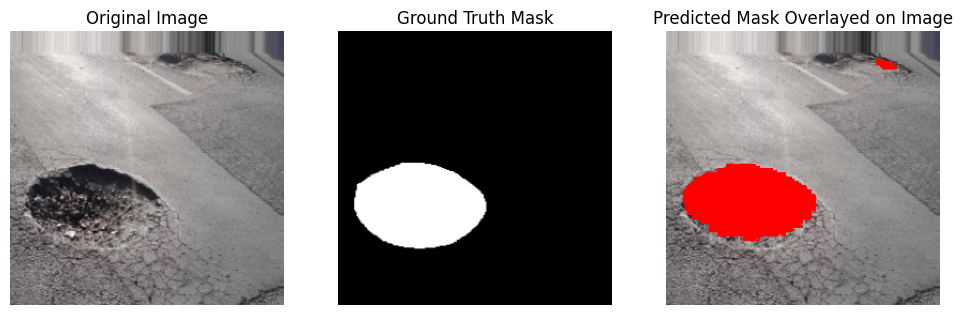

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


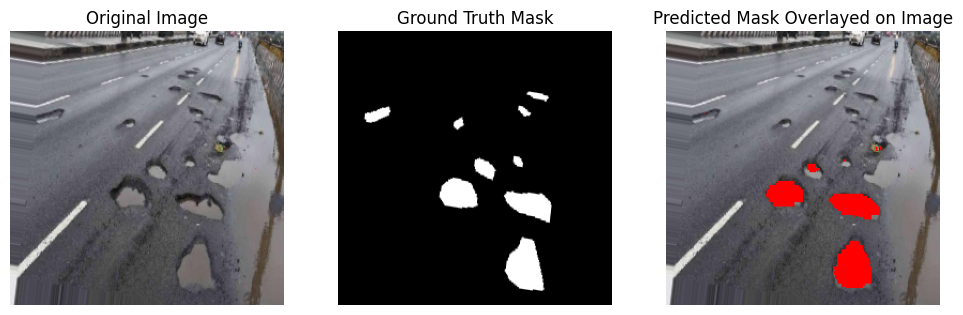

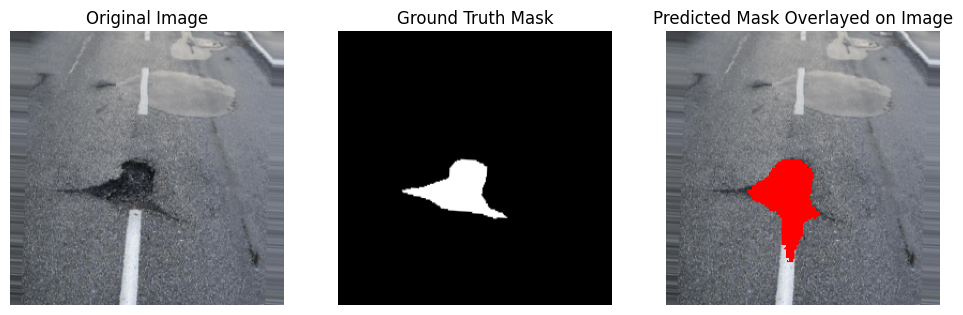

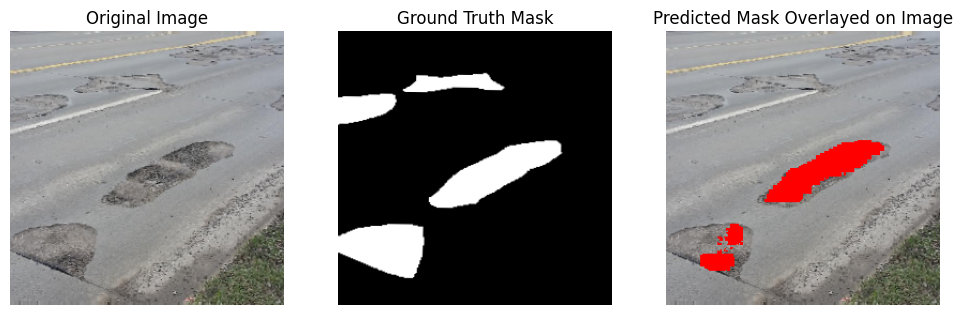

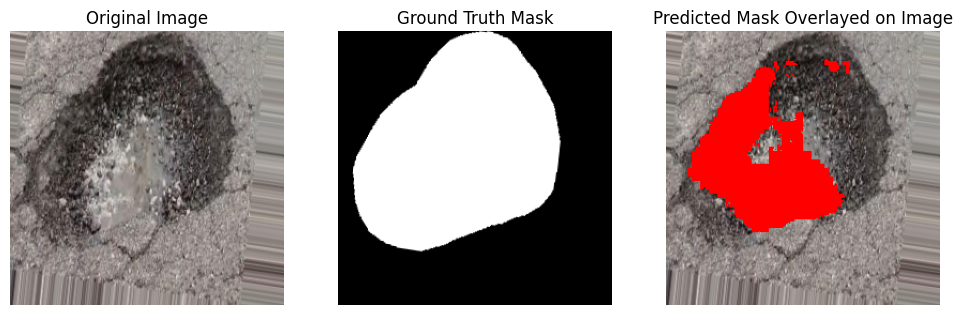

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


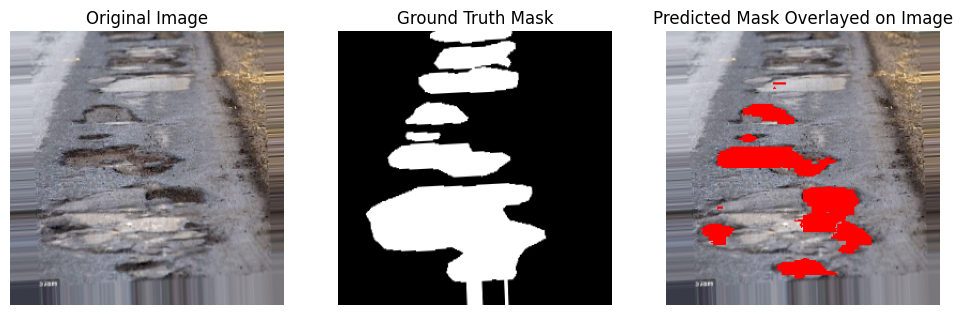

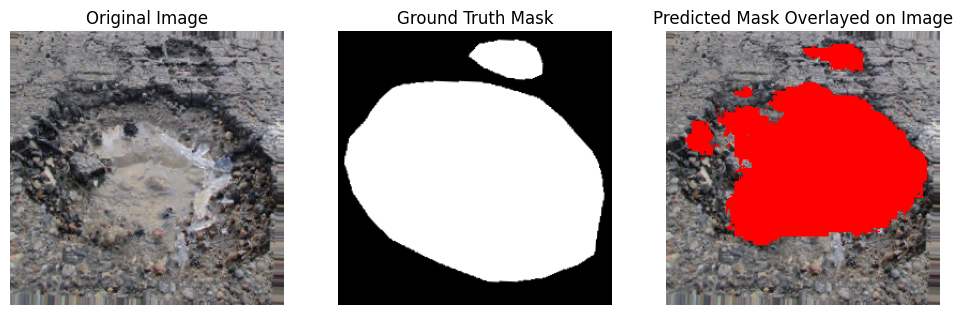

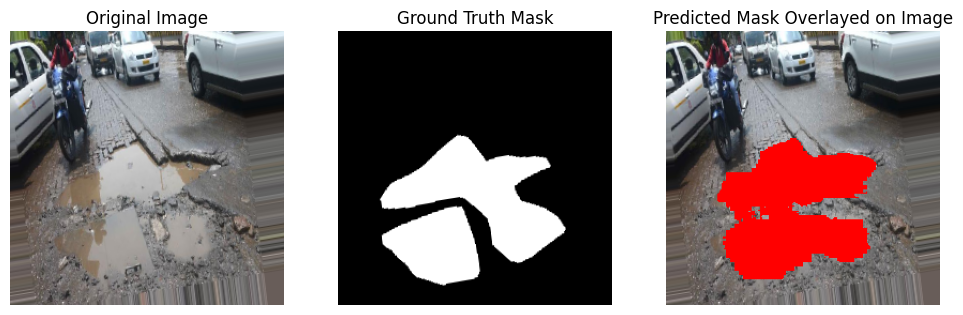

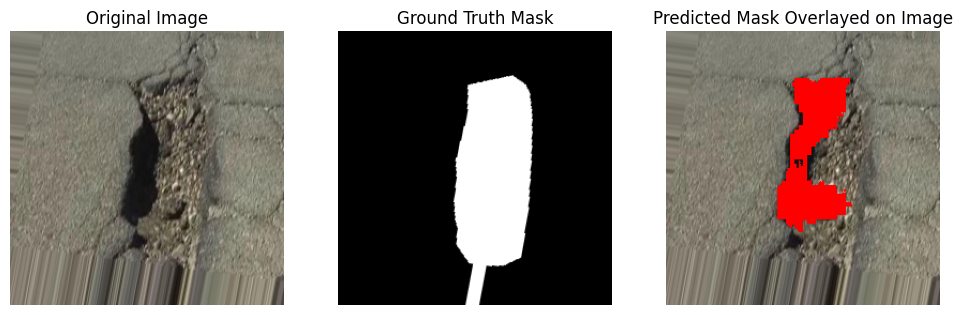

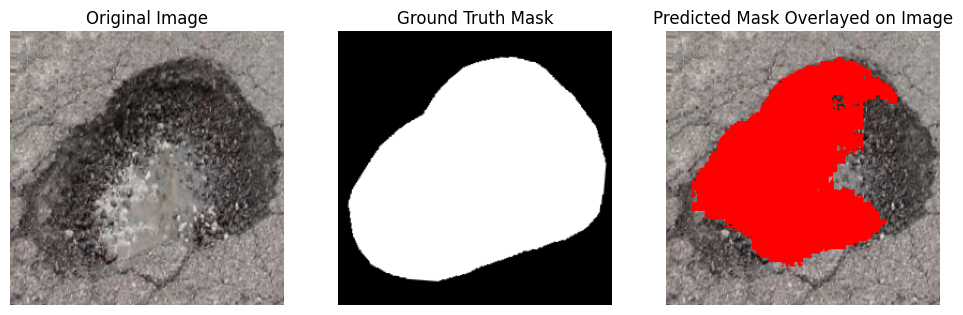

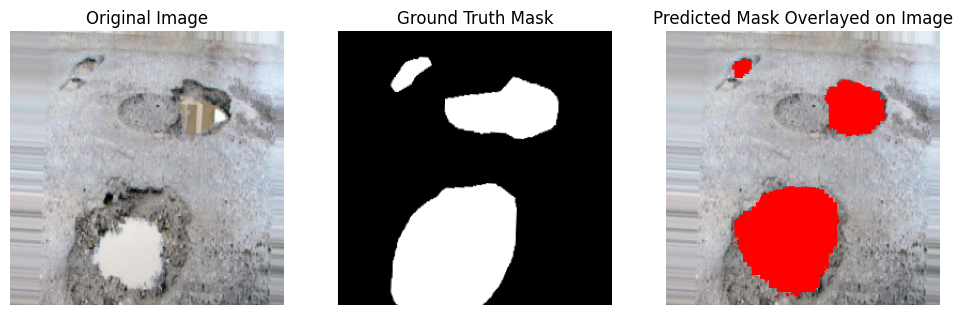

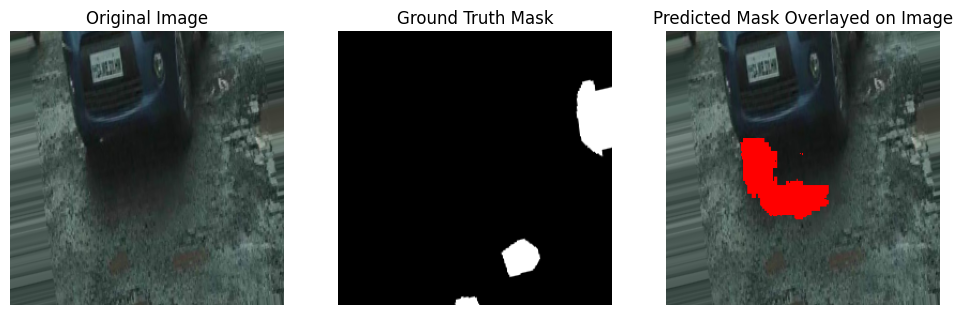

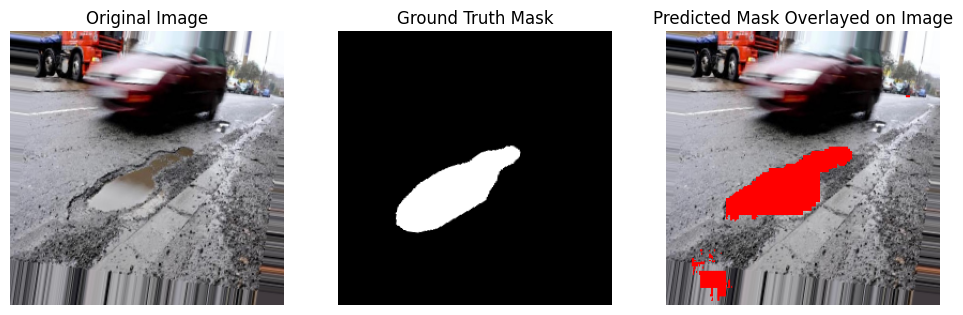

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


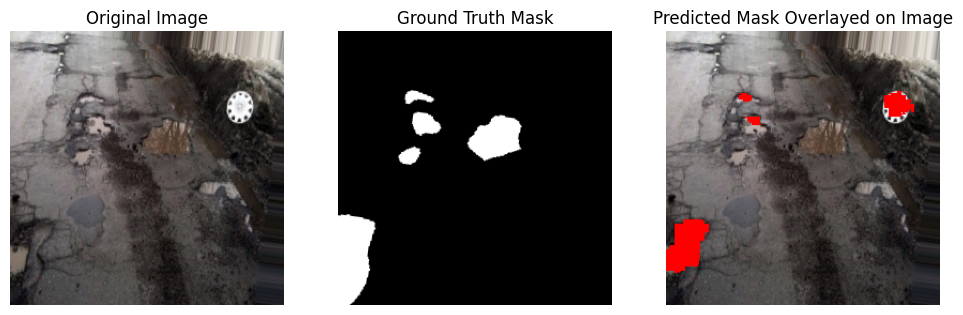

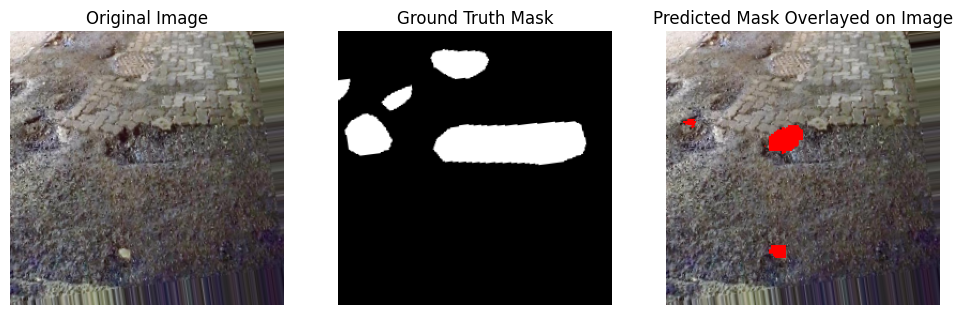

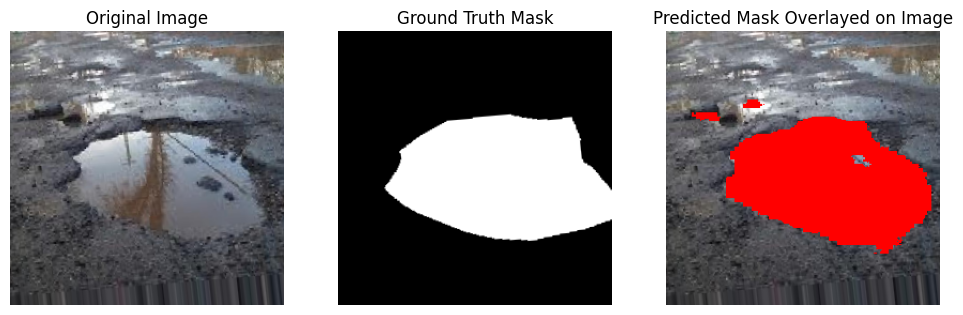

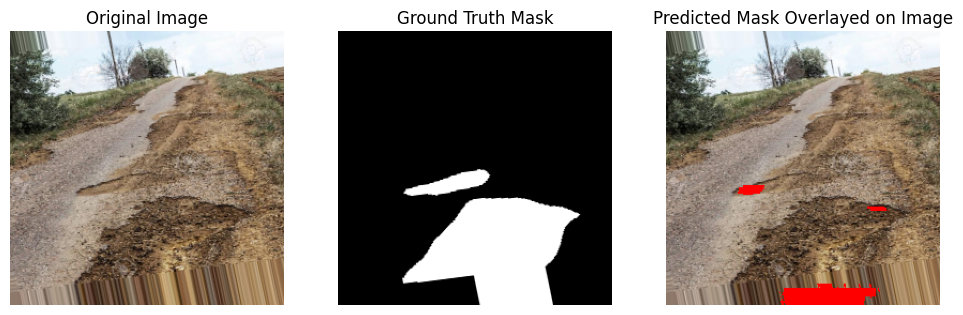

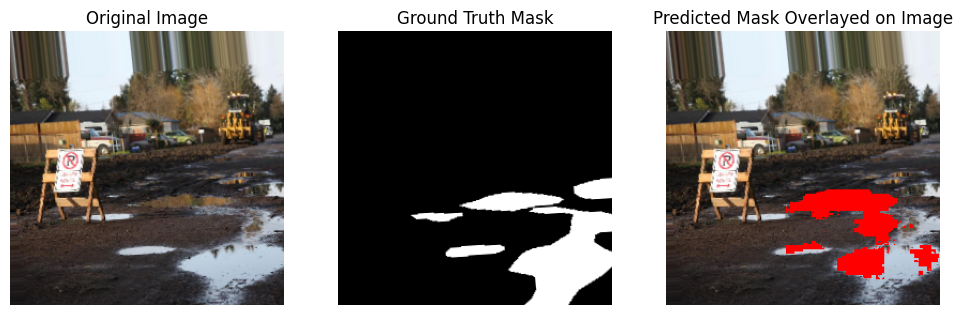

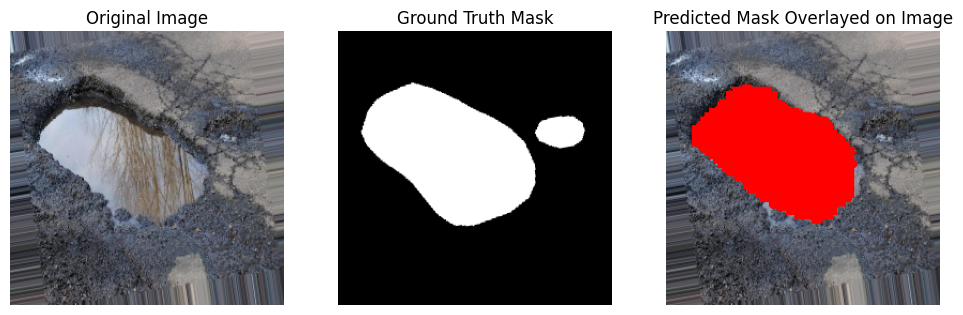

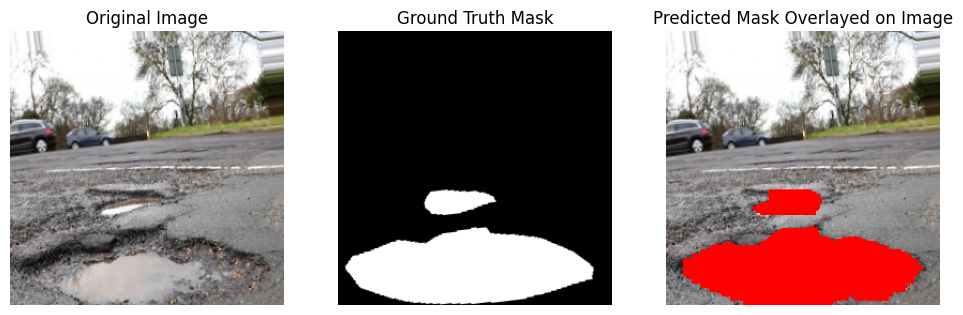

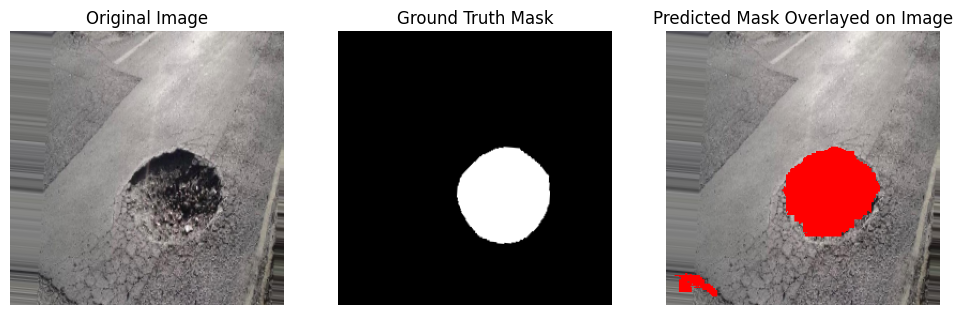

In [ ]:
# Visualize predictions on original images
visualize_predictions_on_original(model, val_gen)